<a href="https://colab.research.google.com/github/ta3h30nk1m/Neural_Style_Transfer_Practice/blob/main/NST_variable_variation_2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [6]:
import tensorflow as tf

import IPython.display as display

import matplotlib.pyplot as plt
import matplotlib as mpl
mpl.rcParams['figure.figsize'] = (24, 24)
mpl.rcParams['axes.grid'] = False

import numpy as np
import PIL.Image
import time
import functools

def tensor_to_image(tensor):
  tensor = tensor*255
  tensor = np.array(tensor, dtype=np.uint8)
  if np.ndim(tensor)>3:
    assert tensor.shape[0] == 1
    tensor = tensor[0]
  return PIL.Image.fromarray(tensor)

from google.colab import drive
drive.mount('/content/gdrive')
content_path = '/content/gdrive/MyDrive/Neural_Style_Transfer/images/contents/cane.jpg/'
style_path = '/content/gdrive/MyDrive/Neural_Style_Transfer/images/styles/brightNight.jpeg/'

def load_img(path_to_img, img_size=512):
  max_dim = img_size  # 이미지 최대 크기
  img = tf.io.read_file(path_to_img)
  img = tf.image.decode_image(img, channels=3)
  img = tf.image.convert_image_dtype(img, tf.float32)

  shape = tf.cast(tf.shape(img)[:-1], tf.float32)
  long_dim = max(shape)
  scale = max_dim / long_dim

  new_shape = tf.cast(shape*scale, tf.int32)

  img = tf.image.resize(img, new_shape)
  img = img[tf.newaxis, :]
  return img

def imshow(image, title=None):
  if len(image.shape) > 3:
    image = tf.squeeze(image, axis=0)
  
  plt.imshow(image)
  if(title):
    plt.title(title)

content_image = load_img(content_path)
style_image = load_img(style_path)

content_layers = ['block5_conv2']

style_layers = [
                'block1_conv1',
                'block2_conv1',
                'block3_conv1',
                'block4_conv1',
                'block5_conv1'
]
num_content_layers = len(content_layers)
num_style_layers = len(style_layers)

def vgg_layers(layer_names):
  vgg = tf.keras.applications.VGG19(include_top=False, weights='imagenet')
  vgg.trainable = False

  outputs = [vgg.get_layer(name).output for name in layer_names]

  model = tf.keras.Model([vgg.input], outputs)
  return model

style_extractor = vgg_layers(style_layers)
style_outputs = style_extractor(style_image*255)

def gram_matrix(input_tensor):
  result = tf.linalg.einsum('bijc,bijd->bcd', input_tensor, input_tensor)  # https://www.tensorflow.org/api_docs/python/tf/einsum
  input_shape = tf.shape(input_tensor)
  num_locations = tf.cast(input_shape[1]*input_shape[2], tf.float32)
  return result / (num_locations)

class StyleContentModel(tf.keras.models.Model):
  def __init__(self, style_layers, content_layers):
    super(StyleContentModel, self).__init__()
    self.vgg = vgg_layers(style_layers + content_layers)
    self.style_layers = style_layers
    self.content_layers = content_layers
    self.num_style_layers = len(style_layers)
    self.vgg.trainable = False
  
  def call(self, inputs):
    # Expects float input in [0, 1]
    inputs = inputs*255.0
    preprocessed_input = tf.keras.applications.vgg19.preprocess_input(inputs)
    outputs = self.vgg(preprocessed_input)
    style_outputs, content_outputs = (outputs[:self.num_style_layers], outputs[self.num_style_layers:])
    style_outputs = [gram_matrix(style_output) for style_output in style_outputs]

    content_dict = {content_name: value for content_name, value in zip(self.content_layers, content_outputs)}
    
    style_dict = {style_name: value for style_name, value in zip(self.style_layers, style_outputs)}

    return {'content': content_dict, 'style': style_dict}

extractor = StyleContentModel(style_layers, content_layers)

results = extractor(tf.constant(content_image))

style_targets = extractor(style_image)['style']
content_targets = extractor(content_image)['content']

image = tf.Variable(content_image)

def normalize(image):
  return tf.clip_by_value(image, clip_value_min=0.0, clip_value_max=1.0)

opt = tf.optimizers.Adam(learning_rate=0.02, beta_1=0.99, epsilon=1e-1)

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


In [7]:
style_weight = 1e-2
content_weight = 1e4
total_variation_weight = 30

def style_content_loss(outputs):
  style_outputs = outputs['style']
  content_outputs = outputs['content']
  style_loss = tf.add_n([tf.reduce_mean((style_outputs[name] - style_targets[name])**2)for name in style_outputs.keys()] )
  style_loss *= style_weight / num_style_layers

  content_loss = tf.add_n([tf.reduce_mean((content_outputs[name] - content_targets[name])**2)for name in content_outputs.keys()] )
  content_loss *= content_weight / num_content_layers

  loss = style_loss + content_loss
  return loss

def high_pass_x_y(image):
  x_var = image[:, :, 1:, :] - image[:, :, :-1, :]
  y_var = image[:, 1:, :, :] - image[:, :-1, :, :]
  return x_var, y_var

@tf.function()
def train_step(image):
  with tf.GradientTape() as tape:
    outputs = extractor(image)
    loss = style_content_loss(outputs)
    loss += total_variation_weight * tf.image.total_variation(image)

  grad = tape.gradient(loss, image)
  opt.apply_gradients([(grad, image)])
  image.assign(normalize(image))

# Progress when train continues

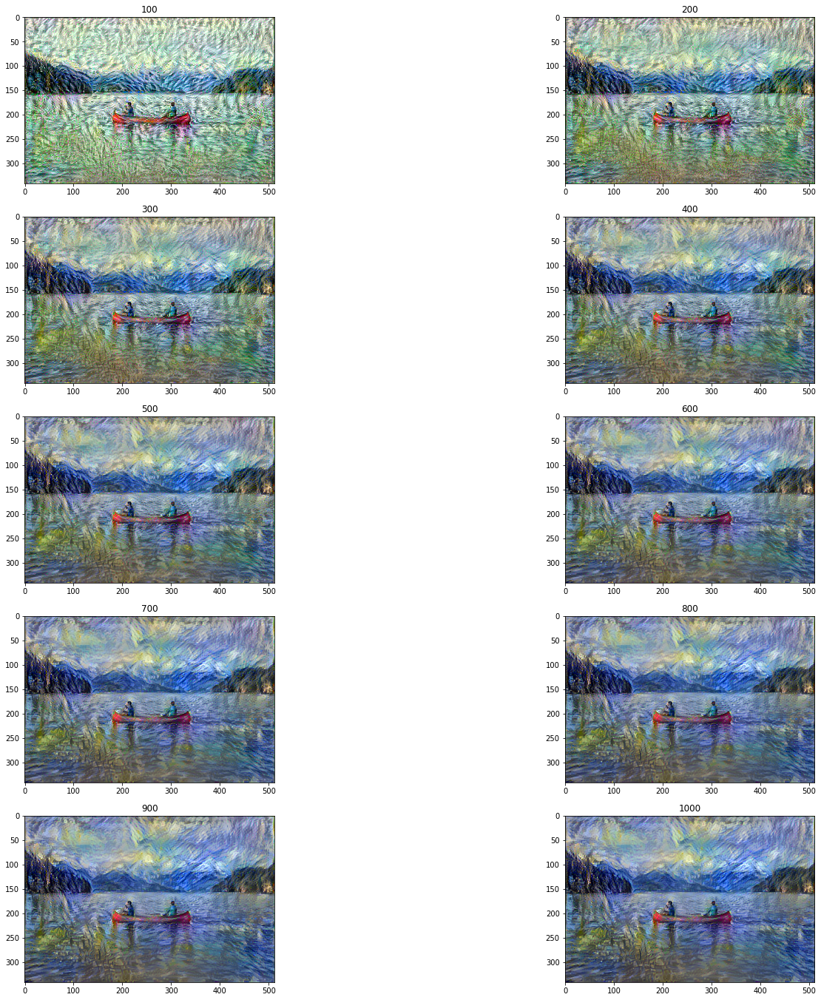

In [ ]:
image = tf.Variable(content_image)

epochs = 10
steps_per_epoch = 100

pos=0
for n in range(epochs):
  pos+=1
  for m in range(steps_per_epoch):
    train_step(image)
  
  plt.subplot(5, 2, pos)
  imshow(image, pos*100)

At first, the produced image seems very noisy and unpleaseant to see, but as the progress continued, the high frequency of styles get decreased and it seems to be natural. 

It seems about 500~600 is enough to make stylized image looks stylized.

# Extractor layer variation

1. Content image layer variation

In [ ]:
# Originally, 'block5_conv2' was chosen.
# 1. choose single but different layer from different blocks in the model
CLs = [
       ['block1_conv2'],
       ['block2_conv2'],
       ['block3_conv2'],
       ['block4_conv2'],
       ['block5_conv2']
]

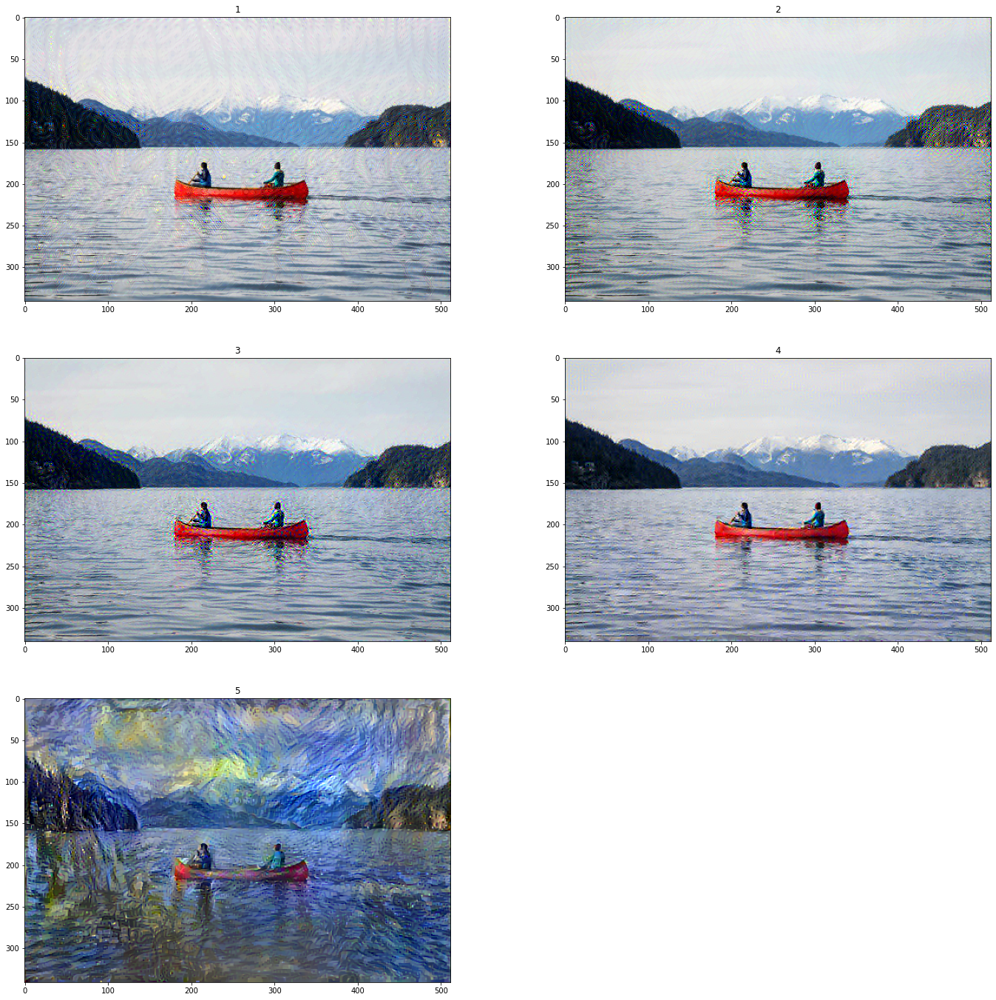

In [ ]:
epochs = 10
steps_per_epoch = 100

pos=0
for cL in CLs:
  extractor = StyleContentModel(style_layers, cL)
  results = extractor(tf.constant(content_image))
  style_targets = extractor(style_image)['style']
  content_targets = extractor(content_image)['content']
  image = tf.Variable(content_image)
  pos+=1
  for n in range(epochs):
    for m in range(steps_per_epoch):
      with tf.GradientTape() as tape:
        outputs = extractor(image)
        style_outputs = outputs['style']
        content_outputs = outputs['content']
        style_loss = tf.add_n([tf.reduce_mean((style_outputs[name] - style_targets[name])**2)for name in style_outputs.keys()] )
        style_loss *= style_weight / num_style_layers

        content_loss = tf.add_n([tf.reduce_mean((content_outputs[name] - content_targets[name])**2)for name in content_outputs.keys()] )
        content_loss *= content_weight / num_content_layers

        loss = style_loss + content_loss
        loss += total_variation_weight * tf.image.total_variation(image)

      grad = tape.gradient(loss, image)
      opt.apply_gradients([(grad, image)])
      image.assign(normalize(image))
  plt.subplot(3,2,pos)
  imshow(image, pos)

It will vary depend on which model we use, but nerual style transfer only work to the last layer

In [ ]:
# 2. Choose layers from last layers in the model
CLs = [
       ['block4_conv4'],
       ['block5_conv1'],
       ['block5_conv2'],
       ['block5_conv3'],
       ['block5_conv4'],
]

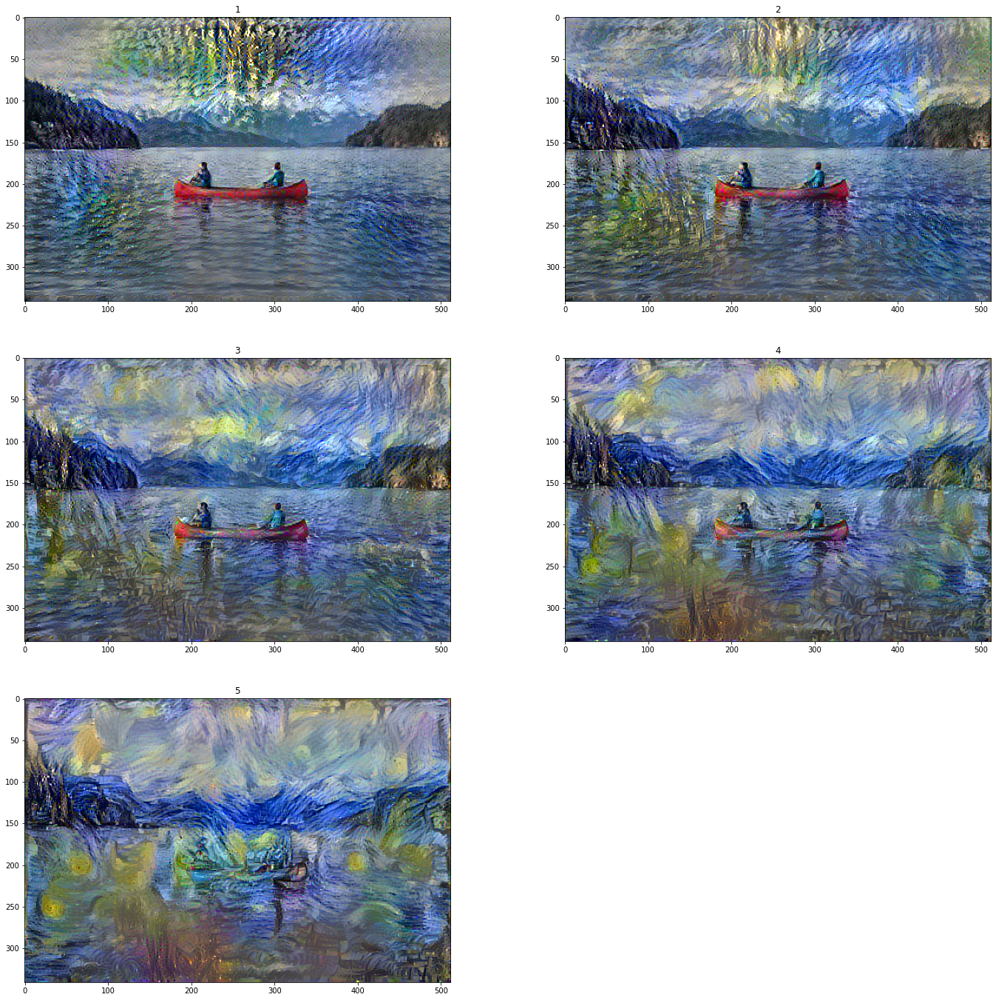

In [ ]:
epochs = 10
steps_per_epoch = 60

pos=0
for cL in CLs:
  extractor = StyleContentModel(style_layers, cL)
  results = extractor(tf.constant(content_image))
  style_targets = extractor(style_image)['style']
  content_targets = extractor(content_image)['content']
  image = tf.Variable(content_image)
  pos+=1
  for n in range(epochs):
    for m in range(steps_per_epoch):
      with tf.GradientTape() as tape:
        outputs = extractor(image)
        style_outputs = outputs['style']
        content_outputs = outputs['content']
        style_loss = tf.add_n([tf.reduce_mean((style_outputs[name] - style_targets[name])**2)for name in style_outputs.keys()] )
        style_loss *= style_weight / num_style_layers

        content_loss = tf.add_n([tf.reduce_mean((content_outputs[name] - content_targets[name])**2)for name in content_outputs.keys()] )
        content_loss *= content_weight / num_content_layers

        loss = style_loss + content_loss
        loss += total_variation_weight * tf.image.total_variation(image)

      grad = tape.gradient(loss, image)
      opt.apply_gradients([(grad, image)])
      image.assign(normalize(image))
  plt.subplot(3,2,pos)
  imshow(image, pos)

From this test, we can see that using layers in higher depth for content extractor works well for NST
(maybe too much for last layer)

++ NST work even we choose the layer that we used for style extractor 

In [ ]:
# 3. choose several layers 
CLs = [
       ['block5_conv2', 'block5_conv3'],
       ['block4_conv4', 'block5_conv4'],
       ['block5_conv1', 'block5_conv2', 'block5_conv3'],
       ['block5_conv1', 'block5_conv2', 'block5_conv3', 'block5_conv4'],
       ['block1_conv2', 'block2_conv2', 'block3_conv2', 'block4_conv2', 'block5_conv2'],
]

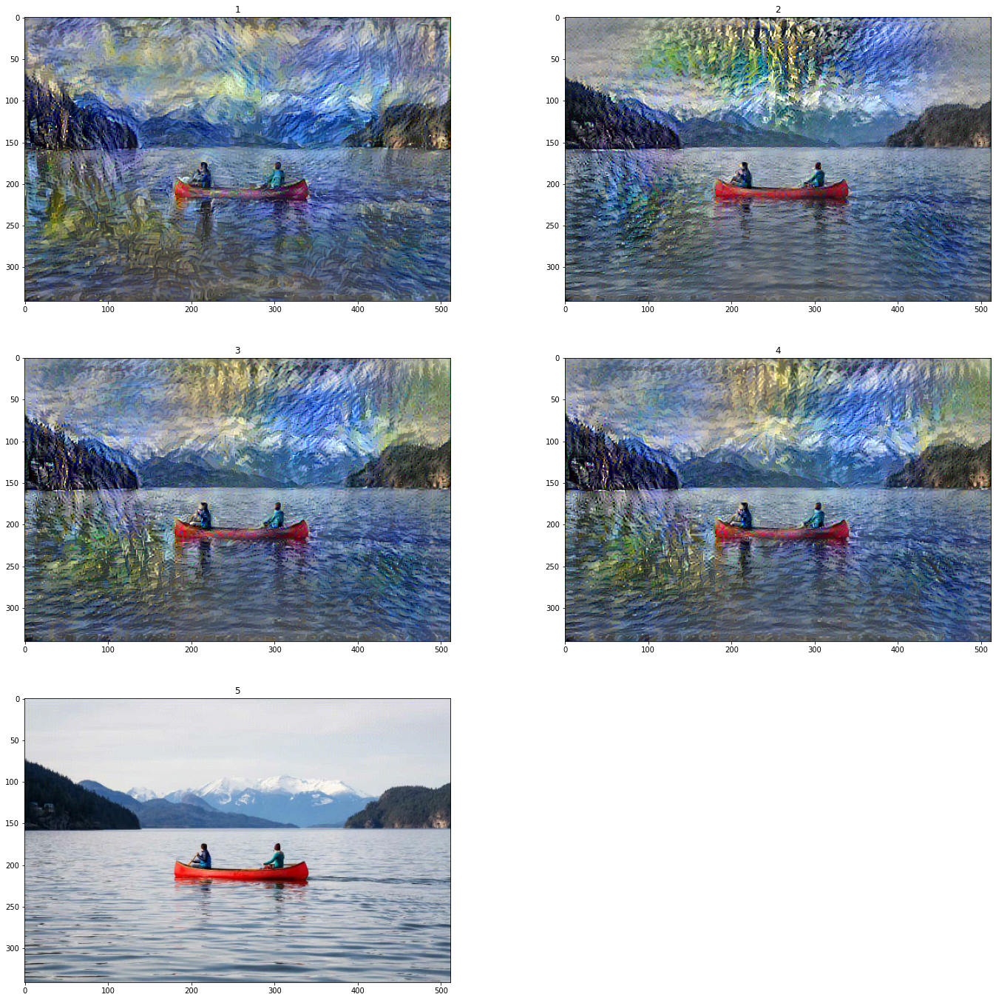

In [ ]:
epochs = 10
steps_per_epoch = 60

pos=0
for cL in CLs:
  extractor = StyleContentModel(style_layers, cL)
  results = extractor(tf.constant(content_image))
  style_targets = extractor(style_image)['style']
  content_targets = extractor(content_image)['content']
  image = tf.Variable(content_image)
  pos+=1
  for n in range(epochs):
    for m in range(steps_per_epoch):
      with tf.GradientTape() as tape:
        outputs = extractor(image)
        style_outputs = outputs['style']
        content_outputs = outputs['content']
        style_loss = tf.add_n([tf.reduce_mean((style_outputs[name] - style_targets[name])**2)for name in style_outputs.keys()] )
        style_loss *= style_weight / num_style_layers

        content_loss = tf.add_n([tf.reduce_mean((content_outputs[name] - content_targets[name])**2)for name in content_outputs.keys()] )
        content_loss *= content_weight / num_content_layers

        loss = style_loss + content_loss
        loss += total_variation_weight * tf.image.total_variation(image)

      grad = tape.gradient(loss, image)
      opt.apply_gradients([(grad, image)])
      image.assign(normalize(image))
  plt.subplot(3,2,pos)
  imshow(image, pos)

From the result above, it seems like the effect of layers averaging out each other. (That's why last pic doesn't change much, since 4 of 5 layers in that training don't have NST effect when applied singly.)

2. Style image layer variation

In [4]:
# Originally, ['block1_conv1','block2_conv1','block3_conv1','block4_conv1', 'block5_conv1'] are chosen

# 1. choose single layer for style extractor
SLs = [
       ['block1_conv1'],
       ['block2_conv1'],
       ['block3_conv1'],
       ['block4_conv1'],
       ['block5_conv1']
]

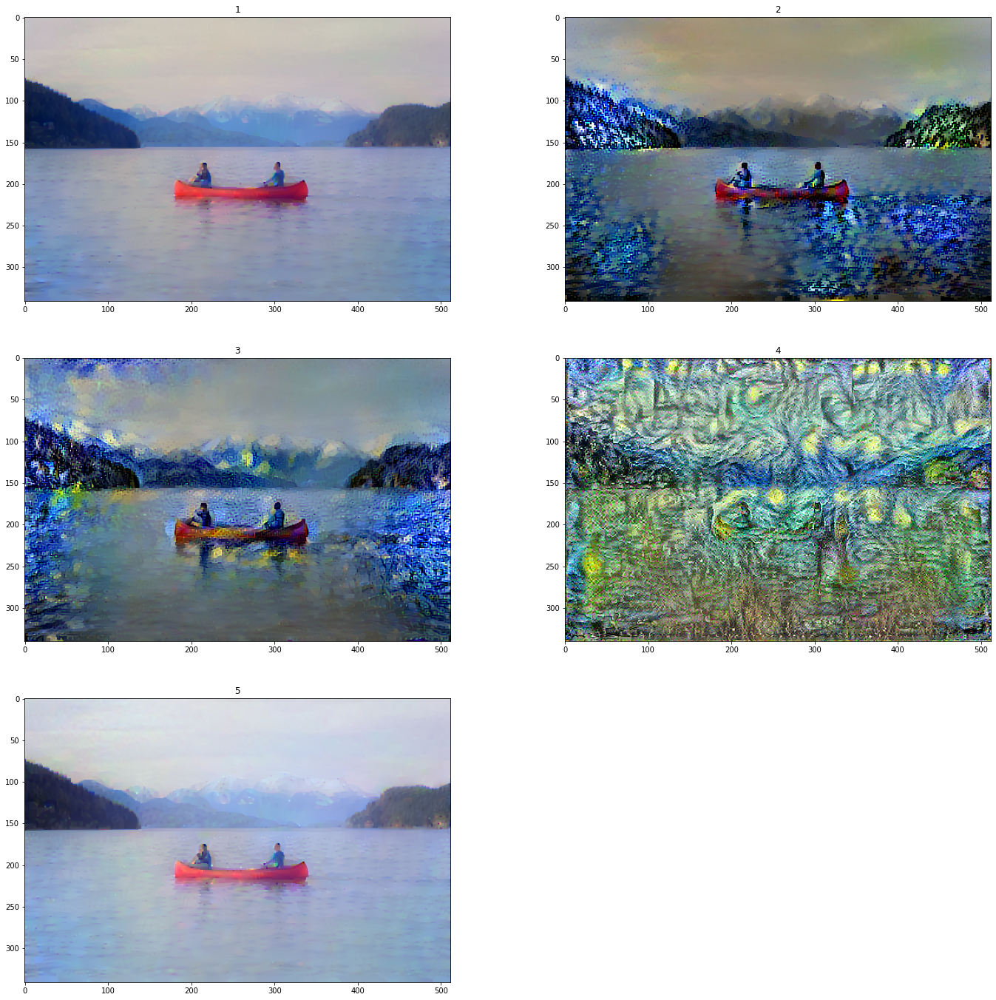

In [5]:
epochs = 10
steps_per_epoch = 60

pos=0
for sL in SLs:
  extractor = StyleContentModel(sL, content_layers)
  results = extractor(tf.constant(content_image))
  style_targets = extractor(style_image)['style']
  content_targets = extractor(content_image)['content']
  image = tf.Variable(content_image)
  pos+=1
  for n in range(epochs):
    for m in range(steps_per_epoch):
      with tf.GradientTape() as tape:
        outputs = extractor(image)
        style_outputs = outputs['style']
        content_outputs = outputs['content']
        style_loss = tf.add_n([tf.reduce_mean((style_outputs[name] - style_targets[name])**2)for name in style_outputs.keys()] )
        style_loss *= style_weight / num_style_layers

        content_loss = tf.add_n([tf.reduce_mean((content_outputs[name] - content_targets[name])**2)for name in content_outputs.keys()] )
        content_loss *= content_weight / num_content_layers

        loss = style_loss + content_loss
        loss += total_variation_weight * tf.image.total_variation(image)

      grad = tape.gradient(loss, image)
      opt.apply_gradients([(grad, image)])
      image.assign(normalize(image))
  plt.subplot(3,2,pos)
  imshow(image, pos)

According to the paper, the receptive size of filter in lower hierarchy is smaller than the higher hierarchy, so the feature that each filter capture is small, which makes the output image to be less smooth(?)

++ additional info: from the result above, we can see what each feature map focuses on. (for example, 'block4_conv1' seems to focus on yellowish part of the style image) 
